In [1]:
import os
from collections import defaultdict
import xml.etree.ElementTree as xet
import pytesseract as pt
import time

import cv2
import numpy as np
import pandas as pd

import plotly.express as px
import matplotlib.pyplot as plt

from glob import glob
from skimage import io
from shutil import copy
import time
import cpuinfo

In [2]:
!pip install py-cpuinfo

In [3]:
base_path = "./data/images/"
path = glob(base_path + '*.xml')
labels_dict = defaultdict(list)

for filename in path:

    info = xet.parse(filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)
    
    image_path = os.path.join(base_path, filename.split("/")[-1].strip(".xml") + ".jpeg")
    h, w, _ = cv2.imread(image_path).shape

    labels_dict['filepath'].append(filename)
    labels_dict['image_path'].append(image_path)
    
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)
    
    labels_dict['width'].append(w)
    labels_dict['height'].append(h)
    
df = pd.DataFrame(labels_dict)
df.to_csv('data/labels.csv',index=False)
df.head()

,filepath,image_path,xmin,xmax,ymin,ymax,width,height
0,./data/images/N11.xml,./data/images/N11.jpeg,131,187,130,144,275,183
1,./data/images/N96.xml,./data/images/N96.jpeg,137,352,141,186,450,290
2,./data/images/N86.xml,./data/images/N86.jpeg,448,638,273,338,640,555
3,./data/images/N54.xml,./data/images/N54.jpeg,189,299,162,188,500,333
4,./data/images/N235.xml,./data/images/N235.jpeg,44,656,128,391,750,562



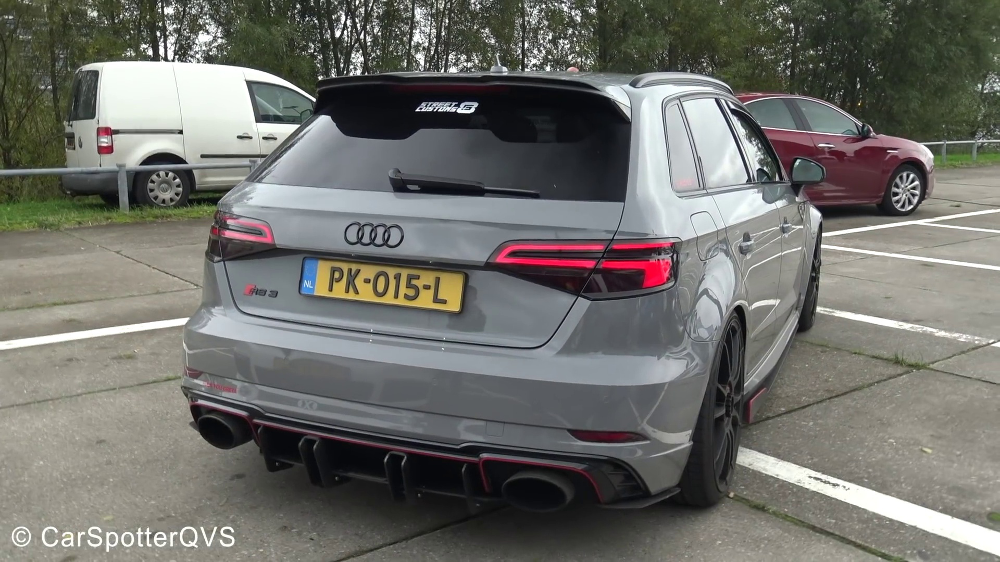

In [4]:
picture_index = 10

file_path = df.loc[picture_index, "image_path"] #path of our image N2.jpeg
img = io.imread(file_path) #Read the image
fig = px.imshow(img)

fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10))
fig.add_shape(
    type='rect',
    x0=df.loc[picture_index, "xmin"], 
    x1=df.loc[picture_index, "xmax"], 
    y0=df.loc[picture_index, "ymin"], 
    y1=df.loc[picture_index, "ymax"], 
    xref='x', 
    yref='y',
    line_color='cyan'
)

In [5]:
### split the data into train and test
df_train = df.iloc[:200]
df_test = df.iloc[200:]

In [6]:
!pip install -r ./yolov5/requirements.txt

In [7]:
# !python ./yolov5/train.py --data ./data/data.yaml --cfg ./yolov5/models/yolov5s.yaml --batch-size 8 --name Model --epochs 100

In [8]:
# !python ./yolov5/export.py --weight ./yolov5/runs/train/Model3/weights/best.pt --include torchscript onnx

In [9]:
import torch

CKPT_PATH = './yolov5/runs/train/Model3/weights/best.pt'

torch.device("cpu")

net = torch.hub.load(
    './yolov5',
    'custom',
    path=CKPT_PATH,
    source='local',

)

'confidence: ' + str(net.conf)

/home/hp/anaconda3/envs/pytorch_1.10.1-hp5/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

YOLOv5 🚀 v6.2-132-g4d50cd3 Python-3.9.9 torch-1.10.1 CUDA:0 (NVIDIA RTX A6000, 48685MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


'confidence: 0.25'

In [10]:
# Set to eval mode and move to desired device
net = net.to("cpu")

In [11]:
# LOAD YOLO MODEL
# net = cv2.dnn.readNetFromONNX('./yolov5/runs/train/Model3/weights/best.onnx')

# net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
# net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

In [12]:
# net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
# net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)

In [13]:
def get_detections(img, net):
    # 1.CONVERT IMAGE TO YOLO FORMAT
    image = img.copy()
    row, col, d = image.shape

    max_rc = max(row, col)
    input_image = np.zeros((max_rc, max_rc, 3),dtype=np.uint8)
    input_image[:row, :col] = image

    # 2. GET PREDICTION FROM YOLO MODEL 
    pred_image = cv2.resize(input_image, dsize=(INPUT_WIDTH,INPUT_HEIGHT), interpolation=cv2.INTER_CUBIC)
    preds = net(img)
    detections = preds.pandas().xyxy[0]
    
    return input_image, detections

def non_maximum_supression(input_image, detections):
    # Filter predictions/detections based on threshold
    # center x, center y, w , h, conf, proba
    boxes = []
    confidences = []

    image_w, image_h = input_image.shape[:2]
    x_factor = image_w/INPUT_WIDTH
    y_factor = image_h/INPUT_HEIGHT

    for i, row in detections.iterrows():
        confidence = row.confidence # confidence of detecting license plate
        if confidence > 0.4:
            cx, cy , w, h = int(row.xmin), int(row.ymin), int(row.xmax), int(row.ymax)

            left = int((cx - 0.5*w)*x_factor)
            top = int((cy-0.5*h)*y_factor)
            width = int(w*x_factor)
            height = int(h*y_factor)
            box = np.array([cx,cy,w,h])
            print(list(box))

            confidences.append(confidence)
            boxes.append(box)

    boxes_np = np.array(boxes).tolist()
    confidences_np = np.array(confidences).tolist()
    
    index = cv2.dnn.NMSBoxes(boxes_np,confidences_np,0.25,0.45)
    
    return boxes_np, confidences_np, index

def drawings(image,boxes_np,confidences_np,index, device_name, fps):
    
    img_w = image.shape[1]
    
    # Add device
    cv2.rectangle(image,(10,10),(500,80),(255,0,255),-1)
    cv2.putText(image, device_name, (20, 60),cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=2)

    # Add time elapsed
    cv2.rectangle(image,(img_w-400,10),(img_w-20,80),(0,0,255),-1)
    cv2.putText(image, "FPS: " + str(round(fps, 2)), (img_w-390, 60),cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=2)

    
    # 5. Drawings
    for ind in index:
        
        x,y,w,h =  boxes_np[ind]
        bb_conf = confidences_np[ind]
        conf_text = 'plate: {:.0f}%'.format(bb_conf*100)
        license_text = extract_text(image,boxes_np[ind])


        cv2.rectangle(image,(x,y),(w,h),(255,0,255),2)
        cv2.rectangle(image,(x,y-30),(w,y),(255,0,255),-1)
        cv2.rectangle(image,(x,h),(w,h+25),(0,0,0),-1)


        cv2.putText(image,conf_text,(x, y-10),cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), thickness=1)
        cv2.putText(image,license_text,(x, h+27),cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,0), 1)
    return image

In [14]:
# predictions flow with return result
def yolo_predictions(img, net):
    start = time.time()
    # step-1: detections
    input_image, detections = get_detections(img, net)
    # step-2: NMS
    boxes_np, confidences_np, index = non_maximum_supression(input_image, detections)
    
    if next(net.parameters()).is_cuda:
        device_name = torch.cuda.get_device_name()
    else:
        device_name = "Intel Xeon(R) Gold 6140 CPU"
    
    done = time.time()
    elapsed = done - start
    
    # step-3: Drawings
    result_img = drawings(img, boxes_np, confidences_np, index, device_name, 1/elapsed)
    return result_img

In [15]:
# extrating text
def extract_text(image, bbox):
    x,y,w,h = bbox
    roi = image[y:h, x:w]
    
    if 0 in roi.shape:
        return 'no number'
    
    else:
        text = pt.image_to_string(roi)
        text = text.strip()
        print(text)
        
        return text

In [16]:
torch.cuda.get_device_name(), next(net.parameters()).is_cuda, cpuinfo.get_cpu_info()["brand_raw"]

('NVIDIA RTX A6000', False, 'Intel(R) Xeon(R) Gold 6140 CPU @ 2.30GHz')


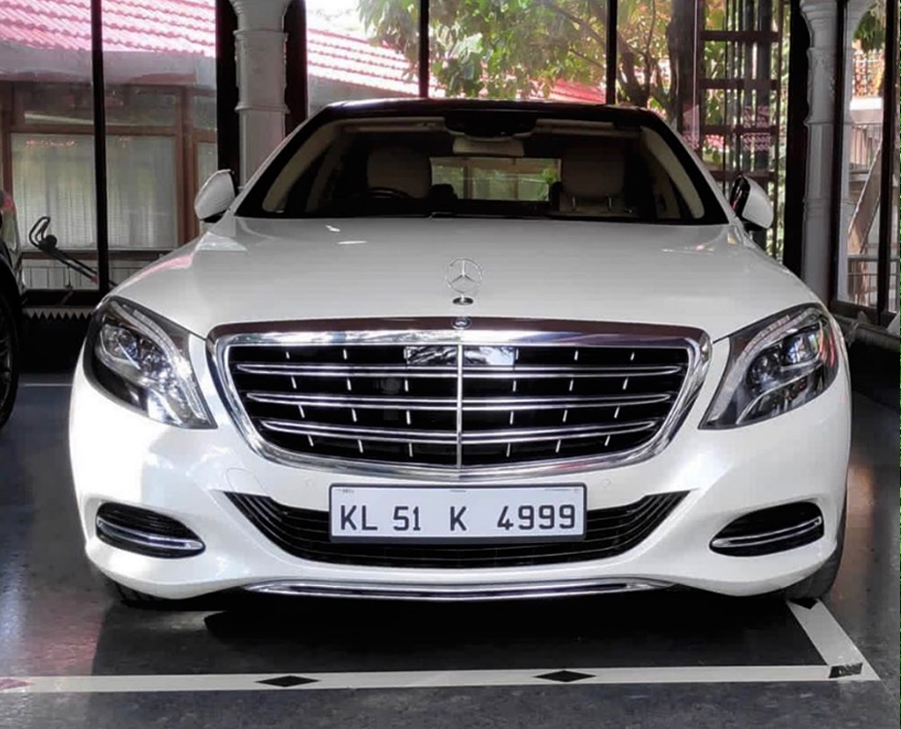

In [17]:
# settings
INPUT_WIDTH =  640
INPUT_HEIGHT = 640

DEVICE = "cpu"

# LOAD THE IMAGE
img = io.imread('./data/TEST/TEST.jpeg')

fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

[329, 487, 585, 540]
KL 51 K 4999



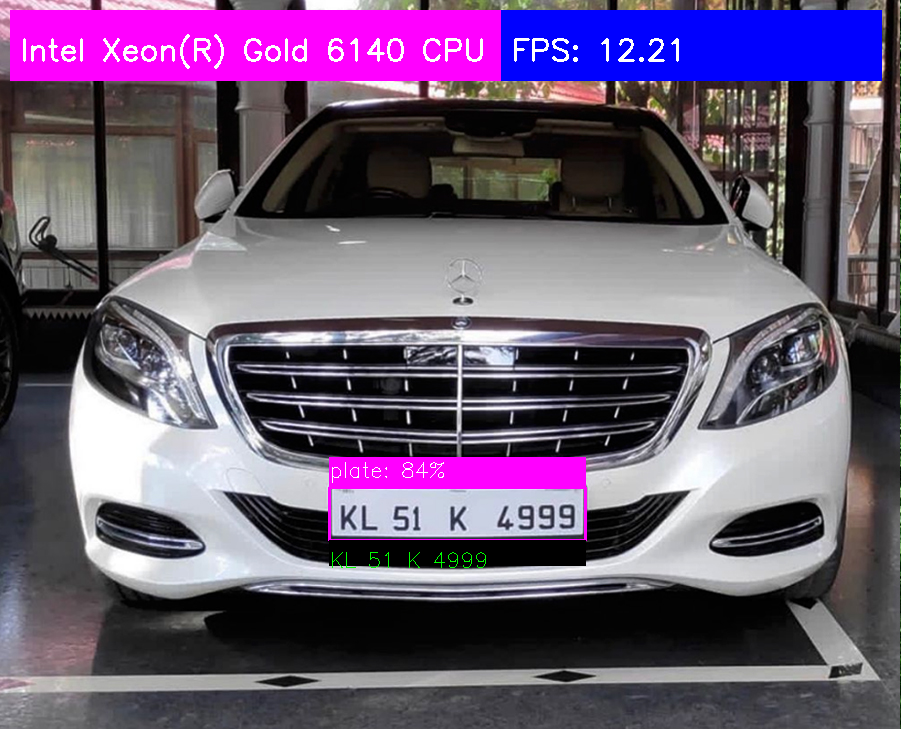

In [18]:
results = yolo_predictions(img, net)

fig = px.imshow(img)
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

[182, 208, 247, 227]
HMH20CS 1938.



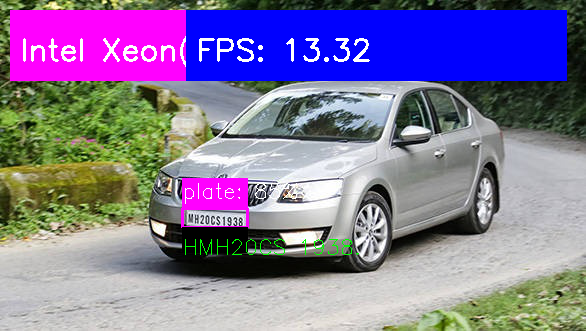

In [19]:
img = io.imread('./data/TEST/N110.jpeg')

results = yolo_predictions(img, net)

fig = px.imshow(img)
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

In [20]:
def vis(img, boxes, scores, cls_ids, conf=0.5, class_names=None):

    for i in range(len(boxes)):
        box = boxes[i]
        cls_id = int(cls_ids[i])
        score = scores[i]
        if score < conf:
            continue
        x0 = int(box[0])
        y0 = int(box[1])
        x1 = int(box[2])
        y1 = int(box[3])

        color = (_COLORS[cls_id] * 255).astype(np.uint8).tolist()
        text = '{}:{:.1f}%'.format(class_names[cls_id], score * 100)
        txt_color = (0, 0, 0) if np.mean(_COLORS[cls_id]) > 0.5 else (255, 255, 255)
        font = cv2.FONT_HERSHEY_SIMPLEX

        txt_size = cv2.getTextSize(text, font, 0.4, 1)[0]
        cv2.rectangle(img, (x0, y0), (x1, y1), color, 2)

        txt_bk_color = (_COLORS[cls_id] * 255 * 0.7).astype(np.uint8).tolist()
        cv2.rectangle(
            img,
            (x0, y0 + 1),
            (x0 + txt_size[0] + 1, y0 + int(1.5*txt_size[1])),
            txt_bk_color,
            -1
        )
        cv2.putText(img, text, (x0, y0 + txt_size[1]), font, 0.4, txt_color, thickness=1)

    return img

def inference(net, img):
    img_info = {"id": 0}
    if isinstance(img, str):
        img_info["file_name"] = os.path.basename(img)
        img = cv2.imread(img)
    else:
        img_info["file_name"] = None

    height, width = img.shape[:2]
    img_info["height"] = height
    img_info["width"] = width
    img_info["raw_img"] = img

    ratio = min(INPUT_HEIGHT / height, INPUT_WIDTH / width)
    img_info["ratio"] = ratio

    img = torch.from_numpy(img).unsqueeze(0)
    img = img.float()
    if DEVICE == "gpu":
        img = img.cuda()

    with torch.no_grad():
        t0 = time.time()
        outputs = net(img)
    return outputs, img_info